In [1]:
# import wfdb
# from wfdb import processing
import os
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import shutil
from IPython.display import display 
import keras
from keras import optimizers, losses, activations, models
from keras.layers import Dense, Input, Dropout, Convolution1D, MaxPool1D, GlobalMaxPool1D, GlobalAveragePooling1D, concatenate, MaxPool2D
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

In [2]:
import os
for dirname, _, filenames in os.walk('C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\denoised_denoised_subject_01.wav
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\denoised_subject_01.wav
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\example_code.m
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\LICENSE.txt
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\Records.csv
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\SHA256SUMS.txt
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0\subject_01.wav
C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-

In [3]:
# directory for dataset
dir1 = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'
df1 = list()

# all the header files from chf dataset
for i in os.listdir(dir1):
    if i.endswith(".wav"):
        df1.append(i)       

df1= pd.DataFrame(df1)
df1.head()

,0
0,denoised_denoised_subject_01.wav
1,denoised_subject_01.wav
2,subject_01.wav
3,subject_02.wav
4,subject_03.wav


In [7]:
from IPython.display import Audio

# Specify the file path to your audio file
file_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0/subject_02.wav'

# Use the Audio class to display and play the audio
audio = Audio(filename=file_path, autoplay=True)
display(audio)

In [9]:
pip install simpleaudio

Note: you may need to restart the kernel to use updated packages.


In [6]:
# pip install wfdb

In [7]:
# import wfdb
# from wfdb import processing

In [ ]:
# pip install soundfile numpy matplotlib

In [8]:
# !pip install librosa numpy pandas matplotlib
import os
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
# folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

In [9]:
import os
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

In [10]:
# Define the directory containing your .wav files
folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'
# Function to calculate basic audio properties
def calculate_audio_properties(audio_data, sample_rate):
    duration = len(audio_data) / sample_rate
    rms = np.sqrt(np.mean(audio_data ** 2))
    return duration, rms

In [11]:
# Lists to store the calculated properties
durations = []
rms_values = []

# Process each .wav file in the directory
for file_name in os.listdir(folder_path):
    if file_name.endswith(".wav"):
        file_path = os.path.join(folder_path, file_name)

        # Read the .wav file
        audio_data, sample_rate = sf.read(file_path)

        # Calculate audio properties
        duration, rms = calculate_audio_properties(audio_data, sample_rate)
        
        # Append to lists
        durations.append(duration)
        rms_values.append(rms)
print(durations)

[602.8, 601.16, 496.57, 603.33, 606.22, 600.9, 608.485, 601.05, 604.775, 600.385, 428.54, 603.425, 600.445, 602.985, 600.505, 600.095, 310.64, 216.755, 600.1345, 606.62, 399.03, 600.48, 384.85, 627.55, 600.64, 600.36, 532.37, 611.545, 600.295, 300.52, 650.415, 602.04, 202.32, 600.89, 537.08, 609.695, 600.46, 607.15, 602.7, 607.17, 610.465, 607.08, 608.925, 600.135, 660.21, 548.725, 602.255, 416.095, 454.065, 600.135, 610.51, 492.655, 577.52, 566.855, 295.765, 304.07, 600.735, 481.49, 422.415, 602.24]


Text(0, 0.5, 'Amplitude')

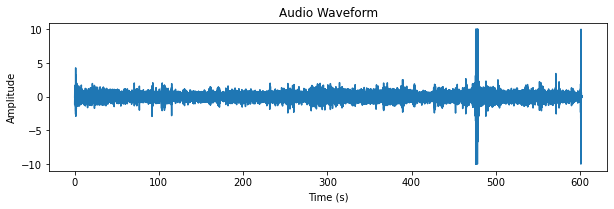

In [12]:
# Display the waveform
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.title('Audio Waveform')
plt.plot(np.arange(len(audio_data)) / sample_rate, audio_data)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

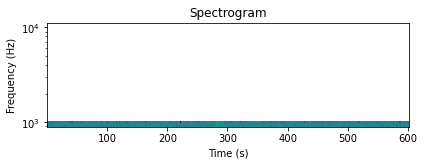

Audio Duration: 602.24 seconds
RMS Value: 0.46051169363676575


In [13]:
# Calculate and display the spectrogram
import matplotlib.pyplot as plt
import scipy.signal as signal
plt.subplot(2, 1, 2)
frequencies, times, amplitudes = signal.spectrogram(audio_data, fs=sample_rate)
plt.pcolormesh(times, frequencies, 10 * np.log10(amplitudes), shading='auto')
plt.title('Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.yscale('log')
plt.tight_layout()
plt.show()

# Calculate and display additional properties (e.g., RMS, duration)
duration = len(audio_data) / sample_rate
rms = np.sqrt(np.mean(audio_data ** 2))

print("Audio Duration:", duration, "seconds")
print("RMS Value:", rms)

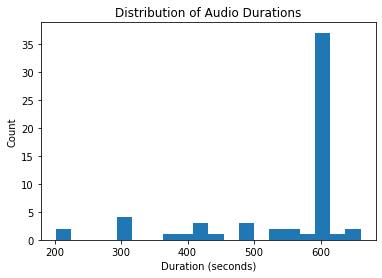

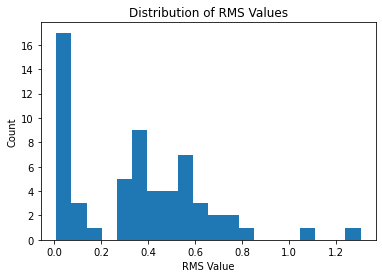

In [14]:
# Create a histogram of audio durations
plt.hist(durations, bins=20)
plt.xlabel('Duration (seconds)')
plt.ylabel('Count')
plt.title('Distribution of Audio Durations')
plt.show()

# Create a histogram of RMS values
plt.hist(rms_values, bins=20)
plt.xlabel('RMS Value')
plt.ylabel('Count')
plt.title('Distribution of RMS Values')
plt.show()

# Add more EDA as needed, such as scatter plots, correlation analysis, etc.

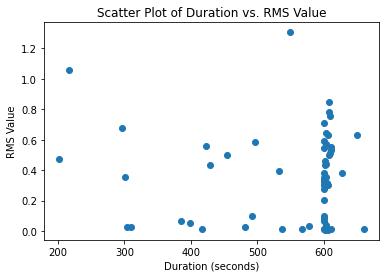

Correlation between Duration and RMS Value:
-0.032430551904210146


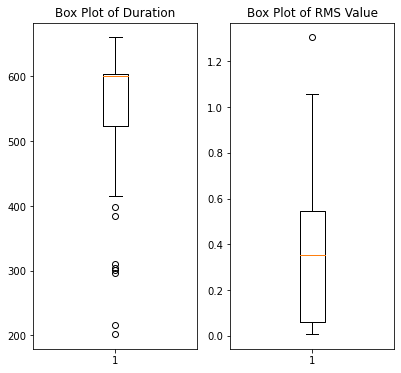

In [15]:
# Example: Scatter plot of RMS vs. Duration
plt.scatter(durations, rms_values)
plt.xlabel('Duration (seconds)')
plt.ylabel('RMS Value')
plt.title('Scatter Plot of Duration vs. RMS Value')
plt.show()

# Example: Correlation between audio properties
correlation = np.corrcoef(durations, rms_values)
print("Correlation between Duration and RMS Value:")
print(correlation[0, 1])

# Example: Box plots of audio properties
plt.figure(figsize=(10, 6))
plt.subplot(131)
plt.boxplot(durations)
plt.title('Box Plot of Duration')
plt.subplot(132)
plt.boxplot(rms_values)
plt.title('Box Plot of RMS Value')
plt.show()

# Add more EDA tasks as needed, such as histograms, bar plots, and statistical analysis.

In [16]:
# ... (Previous code remains the same)

# Additional EDA tasks - Statistical Analysis

# Example: Descriptive statistics for Duration
print("Descriptive Statistics for Duration:")
print("Mean:", np.mean(durations))
print("Median:", np.median(durations))
print("Standard Deviation:", np.std(durations))
print("Minimum:", np.min(durations))
print("Maximum:", np.max(durations))

# Example: Descriptive statistics for RMS values
print("\nDescriptive Statistics for RMS Values:")
print("Mean:", np.mean(rms_values))
print("Median:", np.median(rms_values))
print("Standard Deviation:", np.std(rms_values))
print("Minimum:", np.min(rms_values))
print("Maximum:", np.max(rms_values))

# Example: T-test to compare the means of two groups (e.g., different types of audio)
# You'll need to separate your audio files into groups for this analysis.

# Example: ANOVA test for comparing means across more than two groups
# You can use this to compare means across different categories of audio.

# Add more statistical tests and analysis as needed for your specific research goals.


Descriptive Statistics for Duration:
Mean: 543.9287416666667
Median: 600.4925000000001
Standard Deviation: 110.2686735112052
Minimum: 202.32
Maximum: 660.21

Descriptive Statistics for RMS Values:
Mean: 0.35714740027723446
Median: 0.35464324713197704
Standard Deviation: 0.28690211582384123
Minimum: 0.007761609500799594
Maximum: 1.3048553542041232


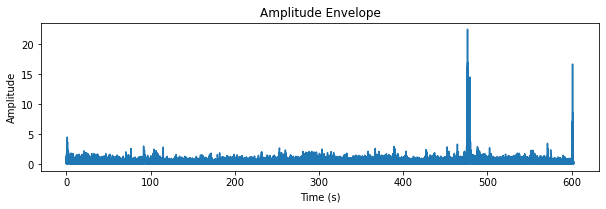

In [17]:
# Visualize the amplitude envelope
envelope = np.abs(signal.hilbert(audio_data))
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.title('Amplitude Envelope')
plt.plot(np.arange(len(envelope)) / sample_rate, envelope)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Perform more EDA and analysis based on your specific research goals
# You can add histograms, pitch analysis, spectral features, etc.
plt.show()

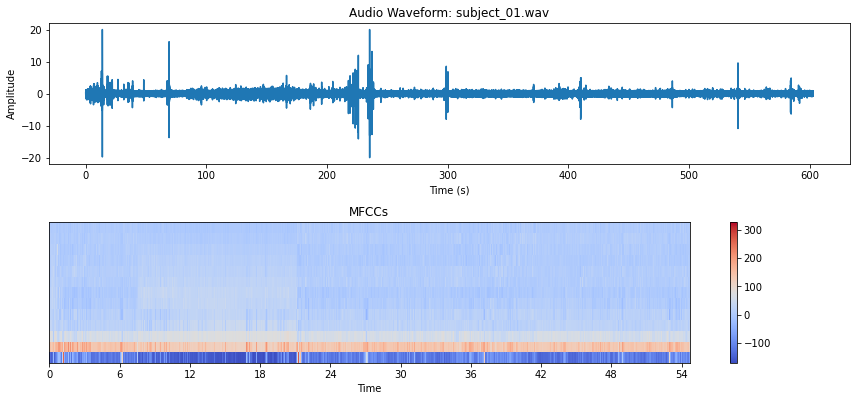

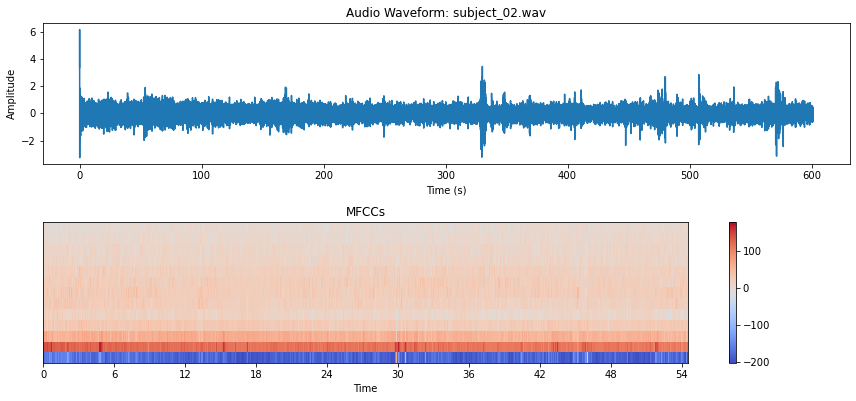

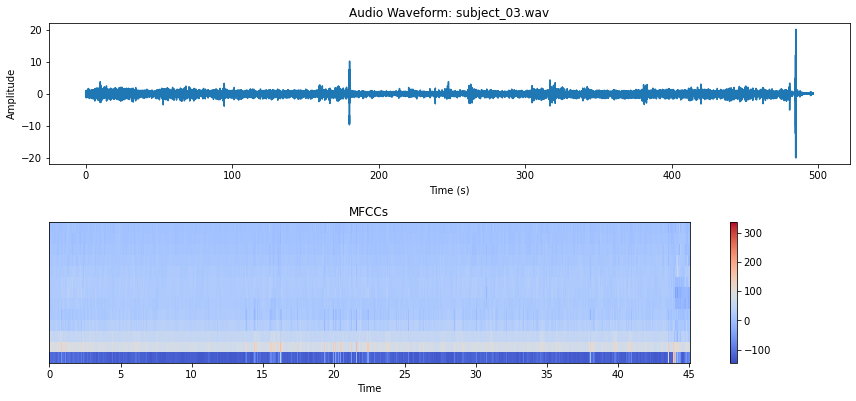

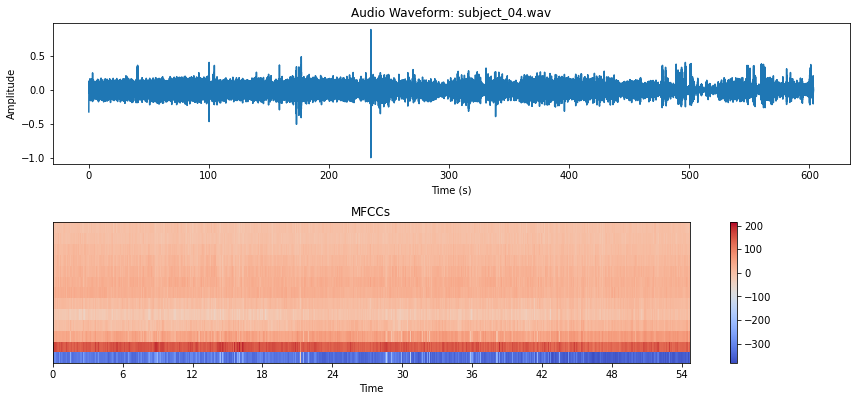

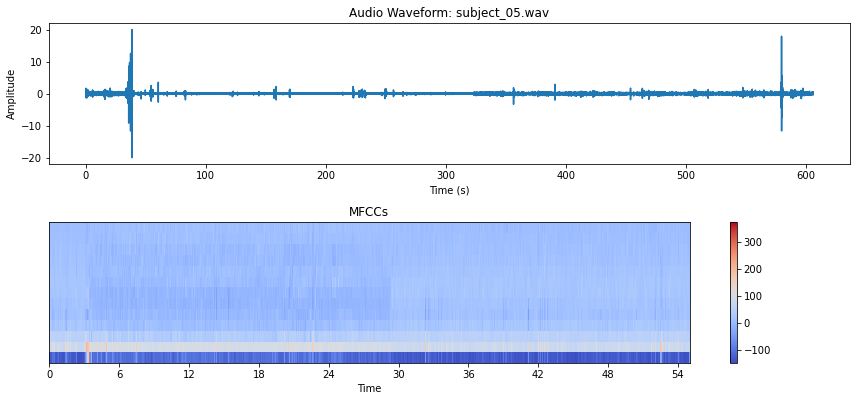

...

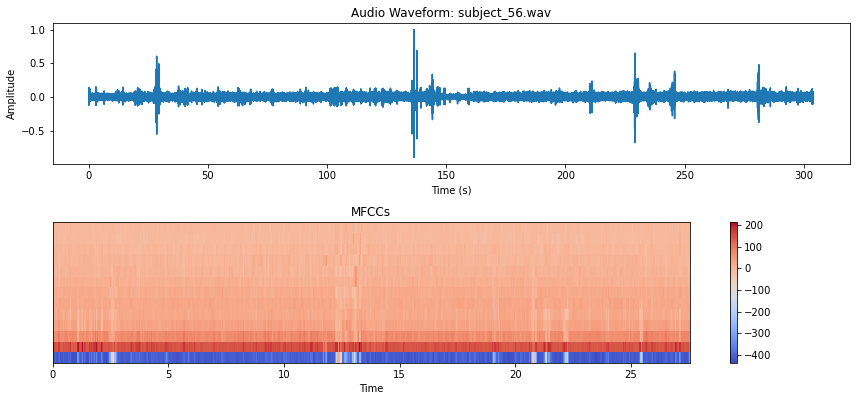

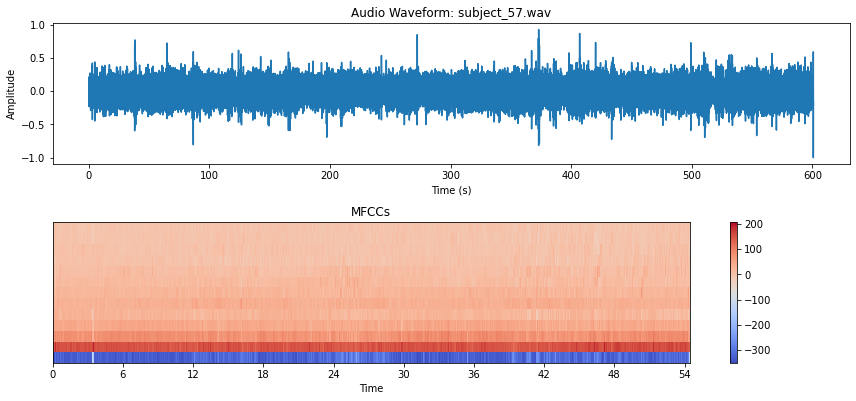

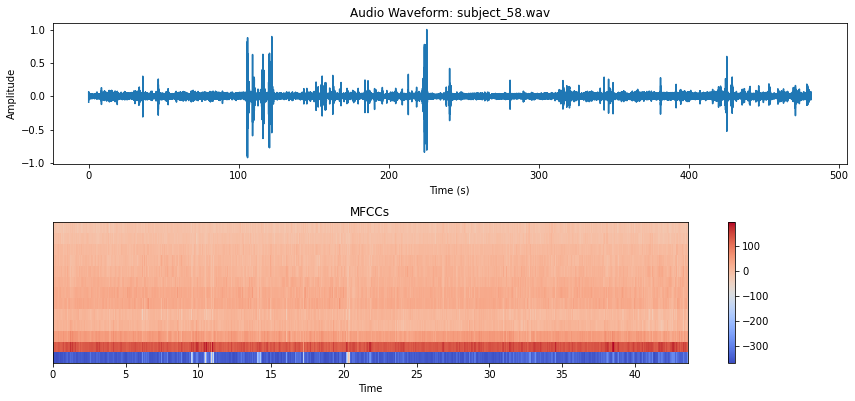

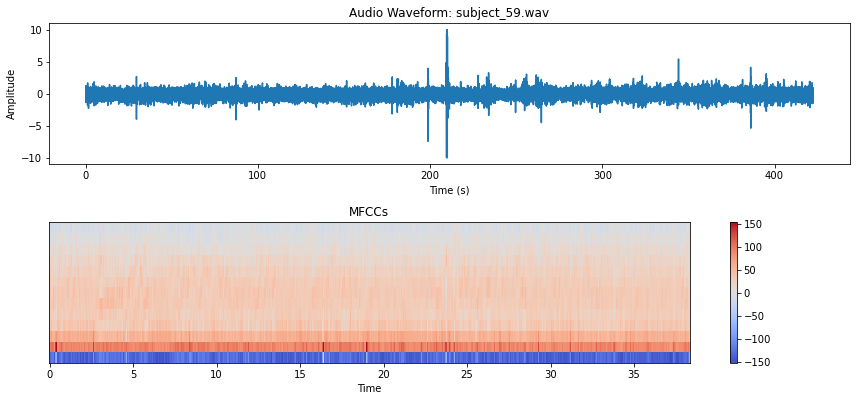

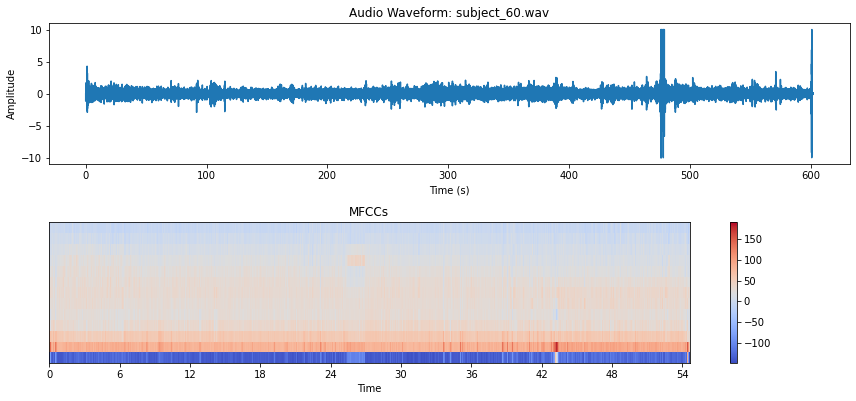

In [18]:
import os
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# Define the folder path where the .wav files are located
folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

# Filter .wav files in the folder
wav_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]

# EDA - Advanced Analysis for each .wav file
for wav_file in wav_files:
    # Load the .wav file
    file_path = os.path.join(folder_path, wav_file)
    audio_data, sample_rate = sf.read(file_path)

    # Calculate and display additional audio features
    duration = len(audio_data) / sample_rate
    rms = np.sqrt(np.mean(audio_data ** 2))
    mean_amplitude = np.mean(audio_data)
    max_amplitude = np.max(np.abs(audio_data))

    # Calculate and visualize MFCCs
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=13)

    # Visualize the waveform
    plt.figure(figsize=(12, 8))
    plt.subplot(3, 1, 1)
    plt.title(f'Audio Waveform: {wav_file}')
    plt.plot(np.arange(len(audio_data)) / sample_rate, audio_data)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Plot MFCCs
    plt.subplot(3, 1, 2)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title('MFCCs')
    plt.tight_layout()

    # Perform more EDA and analysis based on your specific research goals
    # You can add histograms, additional spectral features, etc.

    plt.show()

In [ ]:
# from platform import python_version

# print(python_version())

In [ ]:
# pip install pydub

In [20]:
# from pydub import AudioSegment
# import os
# import matplotlib.pyplot as plt

# # Define the folder path where the .wav files are located
# folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

# # Filter .wav files in the folder
# wav_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]

# # Analyze and plot waveforms for each .wav file
# for wav_file in wav_files:
#     # Load the .wav file
#     file_path = os.path.join(folder_path, wav_file)
#     audio = AudioSegment.from_file(file_path, format="wav")

#     # Extract data as a list of integers
#     audio_data = audio.get_array_of_samples()
#     sample_rate = audio.frame_rate

#     # Calculate and display the waveform
#     duration = len(audio_data) / sample_rate
#     rms = audio.rms
#     mean_amplitude = sum(audio_data) / len(audio_data)
#     max_amplitude = max(audio_data)

#     # Plot the waveform
#     plt.figure(figsize=(12, 6))
#     plt.title(f'Audio Waveform: {wav_file}')
#     plt.plot([x / sample_rate for x in range(len(audio_data))], audio_data)
#     plt.xlabel('Time (s)')
#     plt.ylabel('Amplitude')

#     print(f"Audio File: {wav_file}")
#     print("Audio Duration:", duration, "seconds")
#     print("RMS Value:", rms)
#     print("Mean Amplitude:", mean_amplitude)
#     print("Max Amplitude:", max_amplitude)

#     plt.show()

In [1]:
# from pydub import AudioSegment
# import os
# import matplotlib.pyplot as plt

# # Define the folder path where the .wav files are located
# folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

# # Filter .wav files in the folder
# wav_files = [file for file in os.listdir(folder_path) if file.endswith('wav')]

# # Analyze and plot noise components for each .wav file
# for wav_file in wav_files:
#     # Load the .wav file
#     file_path = os.path.join(folder_path, wav_file)
#     audio = AudioSegment.from_file(file_path, format="wav")

#     # Extract data as a list of integers
#     audio_data = audio.get_array_of_samples()
#     sample_rate = audio.frame_rate

#     # Calculate and display the noise components
#     clean_audio = audio_data  # Replace this with the clean signal if available
#     noise = [a - b for a, b in zip(audio_data, clean_audio)]

#     # Plot the noise components
#     plt.figure(figsize=(12, 6))
#     plt.title(f'Noise Components of {wav_file}')
#     plt.plot([x / sample_rate for x in range(len(noise))], noise)
#     plt.xlabel('Time (s)')
#     plt.ylabel('Amplitude')

#     plt.show()

In [2]:
# import os
# import soundfile as sf
# import numpy as np
# import matplotlib.pyplot as plt
# import librosa.display
# from pydub import AudioSegment

# # Define the folder path where the .wav files are located
# folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

# # Filter .wav files in the folder
# wav_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]

# # EDA - Advanced Analysis for each .wav file
# for wav_file in wav_files:
#     # Load the .wav file
#     file_path = os.path.join(folder_path, wav_file)
#     audio_data, sample_rate = sf.read(file_path)
#     audio = AudioSegment.from_file(file_path, format="wav")
#     # Extract data as a list of integers
#     audio_data = audio.get_array_of_samples()
#     sample_rate = audio.frame_rate

#     # Calculate and display the noise components
#     clean_audio = audio_data  # Replace this with the clean signal if available
#     noise = [a - b for a, b in zip(audio_data, clean_audio)]

#     # Plot the noise components
#     plt.figure(figsize=(12, 6))
#     plt.title(f'Noise Components of {wav_file}')
#     plt.plot([x / sample_rate for x in range(len(noise))], noise)
#     plt.xlabel('Time (s)')
#     plt.ylabel('Amplitude')

#     plt.show()

In [18]:
import soundfile as sf
import numpy as np

def calculate_snr(audio_path):
    try:
        # Load the audio file
        audio_data, _ = sf.read(audio_path)

        # Calculate the power of the audio signal
        signal_power = np.sum(audio_data ** 2) / len(audio_data)

        # Assuming a portion of the signal is noise (adjust as needed)
        # You can also load a separate noise audio file for accurate noise power estimation
        noise_power = 0.1  # Adjust this value or use a noise audio file

        # Calculate the SNR in decibels (dB)
        snr_db = 10 * np.log10(signal_power / noise_power)

        return snr_db

    except FileNotFoundError:
        print(f"File not found: {audio_path}")
        return None

# Specify the path to your audio file
# for i in 
audio_path ="C:/Users/esruj/Desktop/Fall 2023/Capstone/denoised_subject_01.wav"
# audio_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0/subject_01.wav'

# Calculate SNR
snr = calculate_snr(audio_path)

if snr is not None:
    print(f"SNR of '{audio_path}': {snr:.2f} dB")

SNR of 'C:/Users/esruj/Desktop/Fall 2023/Capstone/denoised_subject_01.wav': nan dB


<ipython-input-18-f3c6ba1b619f>:10: RuntimeWarning: invalid value encountered in double_scalars
  signal_power = np.sum(audio_data ** 2) / len(audio_data)


In [15]:
import os
import soundfile as sf
import numpy as np

def calculate_snr(audio_path):
    try:
        # Load the audio file
        audio_data, _ = sf.read(audio_path)

        # Calculate the power of the audio signal
        signal_power = np.sum(audio_data ** 2) / len(audio_data)

        # Assuming a portion of the signal is noise (adjust as needed)
        # You can also load a separate noise audio file for accurate noise power estimation
        noise_power = 0.1  # Adjust this value or use a noise audio file

        # Calculate the SNR in decibels (dB)
        snr_db = 10 * np.log10(signal_power / noise_power)

        return snr_db

    except FileNotFoundError:
        print(f"File not found: {audio_path}")
        return None

# Specify the folder path containing audio files
folder_path = 'C:/Users/esruj/Desktop/Fall 2023/Capstone/indian-institute-of-science-fetal-heart-sound-database-iiscfhsdb-1.0'

# Filter .wav files in the folder
wav_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
snr_values = []
# Calculate SNR for each audio file
for wav_file in wav_files:
    audio_path = os.path.join(folder_path, wav_file)
    snr = calculate_snr(audio_path)
    
    if snr is not None:
        snr_values.append(snr)
        print(f"SNR of '{wav_file}': {snr:.2f} dB")

SNR of 'subject_01.wav': 5.10 dB
SNR of 'subject_02.wav': 1.03 dB
SNR of 'subject_03.wav': 5.32 dB
SNR of 'subject_04.wav': -17.81 dB
SNR of 'subject_05.wav': -0.34 dB
SNR of 'subject_06.wav': 0.91 dB
SNR of 'subject_07.wav': 4.02 dB
SNR of 'subject_08.wav': -3.91 dB
SNR of 'subject_09.wav': -0.00 dB
SNR of 'subject_10.wav': -1.27 dB
SNR of 'subject_11.wav': 2.72 dB
SNR of 'subject_12.wav': 2.86 dB
SNR of 'subject_13.wav': 5.41 dB
SNR of 'subject_14.wav': 1.03 dB
SNR of 'subject_15.wav': 6.98 dB
SNR of 'subject_16.wav': -0.34 dB
SNR of 'subject_17.wav': -21.12 dB
SNR of 'subject_18.wav': 10.49 dB
SNR of 'subject_19.wav': -11.30 dB
SNR of 'subject_20.wav': 5.98 dB
SNR of 'subject_21.wav': -15.94 dB
SNR of 'subject_22.wav': 0.90 dB
SNR of 'subject_23.wav': -13.78 dB
SNR of 'subject_24.wav': 1.65 dB
SNR of 'subject_25.wav': 1.64 dB
SNR of 'subject_26.wav': -13.29 dB
SNR of 'subject_27.wav': 1.87 dB
SNR of 'subject_28.wav': 4.51 dB
SNR of 'subject_29.wav': 0.45 dB
SNR of 'subject_30.wav': 

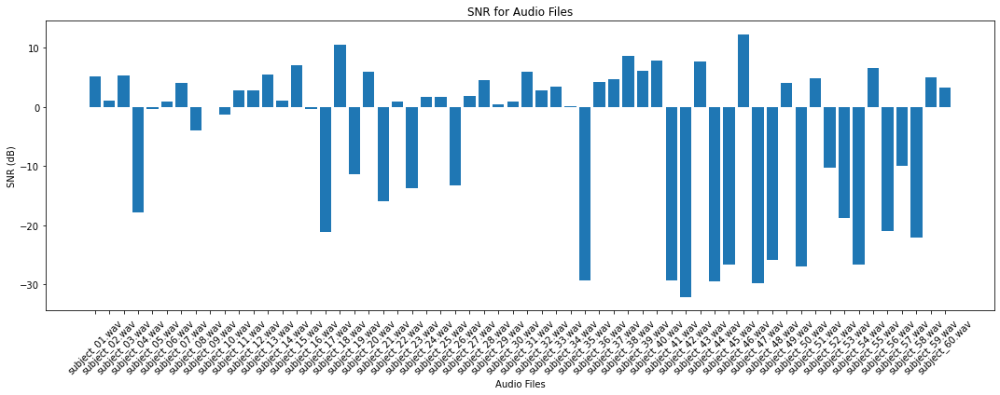

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Plot the SNR values
plt.figure(figsize=(15, 6))
plt.bar(wav_files, snr_values)
plt.xlabel('Audio Files')
plt.ylabel('SNR (dB)')
plt.title('SNR for Audio Files')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()